<a href="https://colab.research.google.com/github/cancan-lab/Notebook-DM2/blob/main/DM2_Image_Clustering_Three_Modes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UTS Data Mining 2 — Image Clustering (RGB vs Grayscale vs CLAHE)
Pipeline dijalankan **tiga kali secara terpisah**: RGB → Grayscale → CLAHE.
Setiap eksperimen: EDA → MobileNetV2 embeddings → PCA → UMAP → KMeans (pilih k via Silhouette) → Agglomerative/DBSCAN → Visualisasi & Ekspor.

## 0) Setup & Paths

In [1]:
#@title Paths & Config
from pathlib import Path
import os, zipfile, random, shutil, math

DATA_ZIP_PATH = "/content/train-20250930T032844Z-1-001.zip"  #@param {type:"string"}
EXTRACT_DIR = "/content/uts_dm2_image_dataset"  #@param {type:"string"}
IMAGE_DIR_NAME = "train"  #@param {type:"string"}
SKIP_UNZIP = False  #@param {type:"boolean"}

os.makedirs(EXTRACT_DIR, exist_ok=True)
if not SKIP_UNZIP:
    assert os.path.exists(DATA_ZIP_PATH), f"ZIP tidak ditemukan: {DATA_ZIP_PATH}"
    with zipfile.ZipFile(DATA_ZIP_PATH, 'r') as zf:
        zf.extractall(EXTRACT_DIR)

DATA_DIR = Path(EXTRACT_DIR) / IMAGE_DIR_NAME
assert DATA_DIR.exists(), f"Folder data tidak ada: {DATA_DIR}"
print("Data dir:", DATA_DIR)

IMG_EXTS = (".png",".jpg",".jpeg",".bmp",".tif",".tiff",".webp",".gif")
all_images = [p for p in DATA_DIR.rglob("*") if p.suffix.lower() in IMG_EXTS]
print(f"Total images found: {len(all_images)}")
assert len(all_images) > 0, "Tidak ada gambar ditemukan!"

OUT_ROOT = Path("/content/uts_dm2_outputs_modes")
OUT_ROOT.mkdir(parents=True, exist_ok=True)
print("Output root:", OUT_ROOT)

Data dir: /content/uts_dm2_image_dataset/train
Total images found: 173
Output root: /content/uts_dm2_outputs_modes


## Util: EDA & Loader

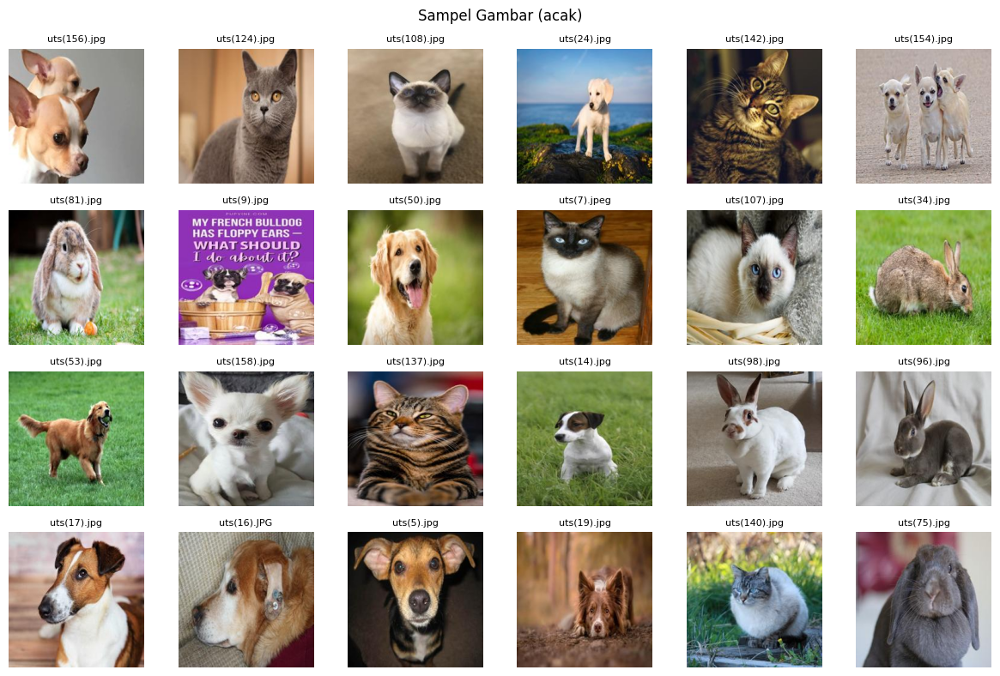

In [2]:
import PIL.Image as Image
import matplotlib.pyplot as plt
import numpy as np, cv2, math, random

def plot_image_grid(paths, cols=6, max_images=30, figsize=(12,8), title=None):
    paths = paths[:max_images]
    rows = math.ceil(len(paths)/cols)
    plt.figure(figsize=figsize)
    for i,p in enumerate(paths,1):
        try:
            img = Image.open(p).convert("RGB")
        except Exception as e:
            print("Skip:", p, e); continue
        plt.subplot(rows, cols, i)
        plt.imshow(img)
        plt.axis("off")
        plt.title(Path(p).name, fontsize=8)
    if title:
        plt.suptitle(title, y=0.98)
    plt.tight_layout()
    plt.show()

sample_paths = random.sample(all_images, k=min(24, len(all_images)))
plot_image_grid(sample_paths, cols=6, max_images=24, title="Sampel Gambar (acak)")

In [3]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import numpy as np, cv2

IMG_SIZE = 224

def center_crop(img):
    h, w = img.shape[:2]
    m = min(h, w)
    y0 = (h - m) // 2
    x0 = (w - m) // 2
    return img[y0:y0+m, x0:x0+m]

def safe_imread(path):
    try:
        arr = np.fromfile(str(path), dtype=np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_COLOR)
    except Exception:
        img = None
    if img is None:
        try:
            pil = image.load_img(str(path))
            img = cv2.cvtColor(np.array(pil), cv2.COLOR_RGB2BGR)
        except Exception:
            return None
    return img

def load_and_preprocess_rgb(paths):
    batch = np.zeros((len(paths), IMG_SIZE, IMG_SIZE, 3), dtype=np.float32)
    for i,p in enumerate(paths):
        img = safe_imread(p)
        if img is None: batch[i] = 0.0; continue
        img = center_crop(img)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
        g = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        batch[i] = preprocess_input(g.astype(np.float32))
    return batch

def load_and_preprocess_grayscale(paths):
    batch = np.zeros((len(paths), IMG_SIZE, IMG_SIZE, 3), dtype=np.float32)
    for i,p in enumerate(paths):
        img = safe_imread(p)
        if img is None: batch[i] = 0.0; continue
        img = center_crop(img)
        g = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        g = cv2.resize(g, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
        g = np.stack([g,g,g], axis=-1)
        batch[i] = preprocess_input(g.astype(np.float32))
    return batch

def load_and_preprocess_clahe(paths):
    batch = np.zeros((len(paths), IMG_SIZE, IMG_SIZE, 3), dtype=np.float32)
    for i,p in enumerate(paths):
        img = safe_imread(p)
        if img is None: batch[i] = 0.0; continue
        img = center_crop(img)
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        L, A, B = cv2.split(lab)
        cla = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        L = cla.apply(L)
        lab = cv2.merge([L,A,B])
        img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_AREA)
        g = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        batch[i] = preprocess_input(g.astype(np.float32))
    return batch

## Util: Ekstraksi Fitur, Reduksi Dimensi, Clustering, Visualisasi

In [4]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from sklearn.decomposition import PCA
# !pip install umap-learn -q
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np, math, shutil

def extract_embeddings(loader_func, img_paths, batch_size=32):
    base_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")
    base_model.trainable = False
    embs = []
    for i in range(0, len(img_paths), batch_size):
        batch_paths = img_paths[i:i+batch_size]
        batch = loader_func(batch_paths)
        emb = base_model.predict(batch, verbose=0)
        embs.append(emb)
    return np.vstack(embs)

def pca_umap(X, n_pca=50, random_state=42):
    pca = PCA(n_components=min(n_pca, X.shape[1]))
    Xp = pca.fit_transform(X)
    um = umap.UMAP(n_neighbors=15, min_dist=0.0, n_components=2, random_state=random_state)
    Xu = um.fit_transform(Xp)
    return Xp, Xu, pca

def try_kmeans(X, k_range=range(2,11)):
    scores, models = [], {}
    for k in k_range:
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = km.fit_predict(X)
        sil = silhouette_score(X, labels)
        scores.append((k, sil))
        models[k] = (km, labels)
    ks = [k for k,_ in scores]
    sils = [s for _,s in scores]
    plt.figure(figsize=(6,4))
    plt.plot(ks, sils, marker="o")
    plt.xlabel("k"); plt.ylabel("Silhouette")
    plt.title("KMeans — Silhouette vs k")
    plt.grid(True); plt.show()
    best_k = ks[int(np.argmax(sils))]
    km_best, labels_best = models[best_k]
    return best_k, km_best, labels_best

def metrics_report(X, labels, name="Model"):
    sil = silhouette_score(X, labels)
    ch  = calinski_harabasz_score(X, labels)
    db  = davies_bouldin_score(X, labels)
    print(f"{name}: Silhouette={sil:.3f} | Calinski-Harabasz={ch:.1f} | Davies-Bouldin={db:.3f}")

def scatter_by_labels(X2d, labels, title):
    plt.figure(figsize=(7,6))
    uniq = sorted(set(labels))
    for u in uniq:
        mask = labels == u
        plt.scatter(X2d[mask,0], X2d[mask,1], s=18, label=str(u), alpha=0.8)
    plt.legend(title="Cluster", bbox_to_anchor=(1.05,1), loc="upper left")
    plt.title(title)
    plt.xlabel("UMAP-1"); plt.ylabel("UMAP-2")
    plt.tight_layout()
    plt.show()

def save_examples_grid(filenames, X_pca, labels, kmeans_model, out_dir, n_per_cluster=12, cols=6):
    out_dir = Path(out_dir)
    out_dir.mkdir(parents=True, exist_ok=True)
    from sklearn.metrics import pairwise_distances
    centers = kmeans_model.cluster_centers_
    dists = pairwise_distances(X_pca, centers, metric='euclidean')
    dist_min = dists.min(axis=1)
    df = pd.DataFrame({"filepath": filenames, "cluster": labels, "dist": dist_min})
    import PIL.Image as Image
    for c, sub in df.sort_values("dist").groupby("cluster"):
        sel = sub.head(n_per_cluster)
        paths = sel["filepath"].tolist()
        rows = math.ceil(len(paths)/cols)
        plt.figure(figsize=(12, rows*2.2))
        for i,p in enumerate(paths,1):
            try:
                img = Image.open(p).convert("RGB")
            except:
                continue
            plt.subplot(rows, cols, i)
            plt.imshow(img); plt.axis("off")
            plt.title(Path(p).name, fontsize=7)
        plt.suptitle(f"Cluster {c} — {len(sub)} images", y=0.98)
        plt.tight_layout()
        fig_path = out_dir / f"cluster_{c}_grid.png"
        plt.savefig(fig_path, dpi=150); plt.show()
        print("Saved grid:", fig_path)
        tgt = out_dir / f"cluster_{c}_files"
        tgt.mkdir(exist_ok=True)
        for p in paths:
            try:
                shutil.copy2(p, tgt / Path(p).name)
            except Exception:
                pass
    return df

# Eksperimen 1 — **RGB**

/tmp/ipython-input-1061819322.py:13: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")


Embeddings rgb (173, 1280)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Explained variance: 0.7731


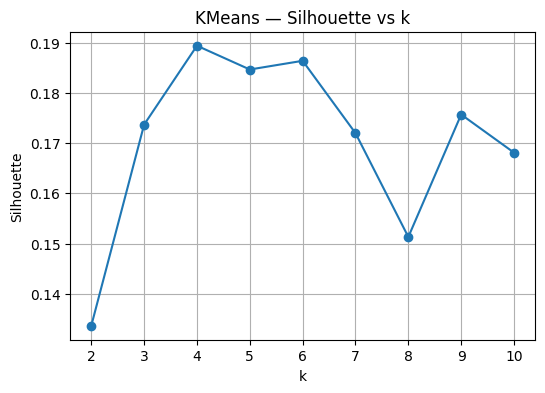

Best k (KMeans, rgb): 4
KMeans(k=4) — RGB: Silhouette=0.189 | Calinski-Harabasz=22.0 | Davies-Bouldin=2.112
Agglomerative(k=4, ward) — RGB: Silhouette=0.179 | Calinski-Harabasz=21.5 | Davies-Bouldin=1.944
DBSCAN clusters: 0 | noise: 173


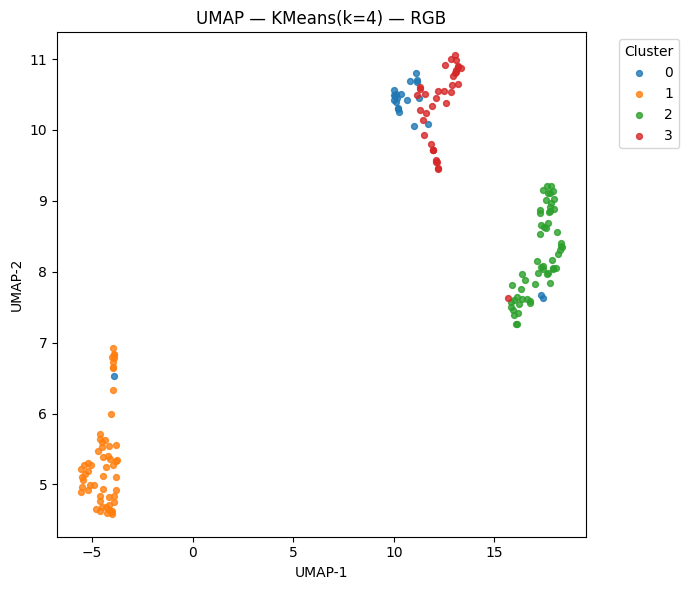

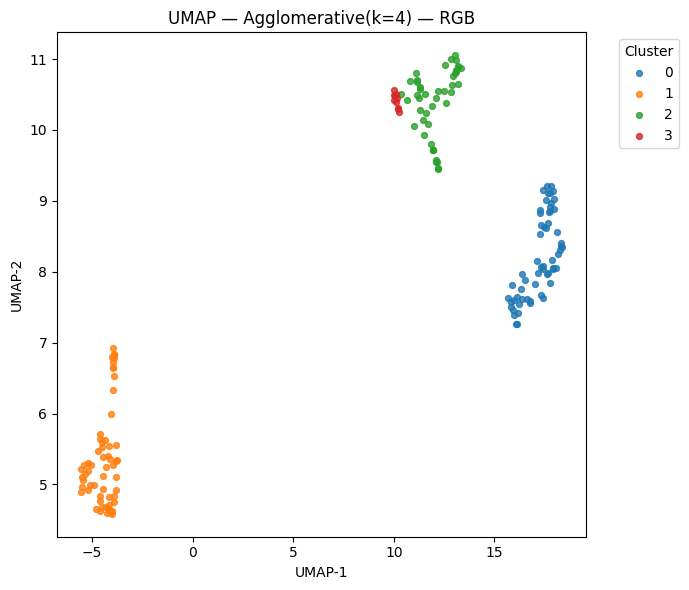

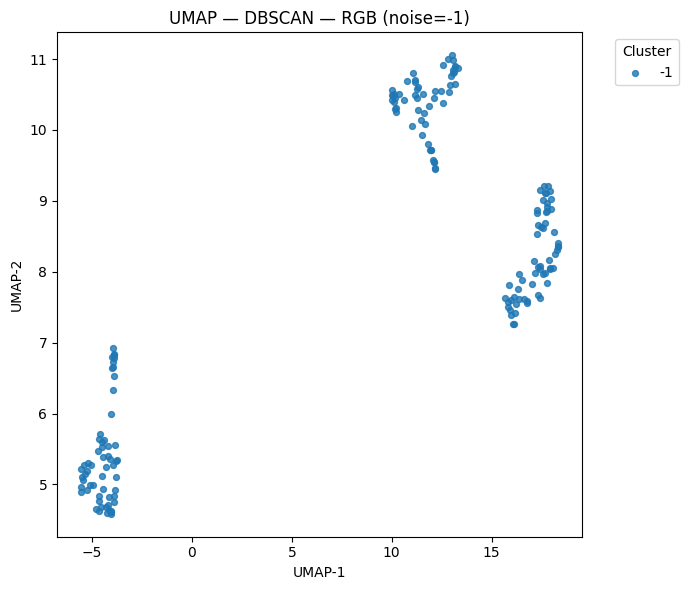

Saved: /content/uts_dm2_outputs_modes/rgb/clusters_kmeans_rgb.csv


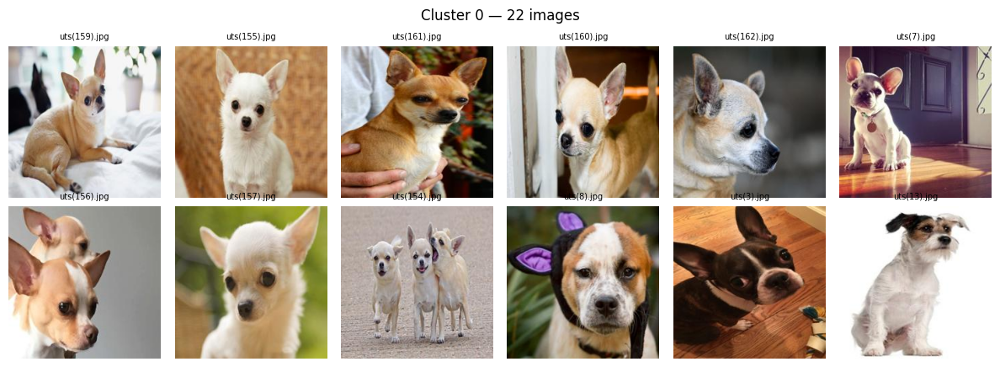

Saved grid: /content/uts_dm2_outputs_modes/rgb/examples/cluster_0_grid.png


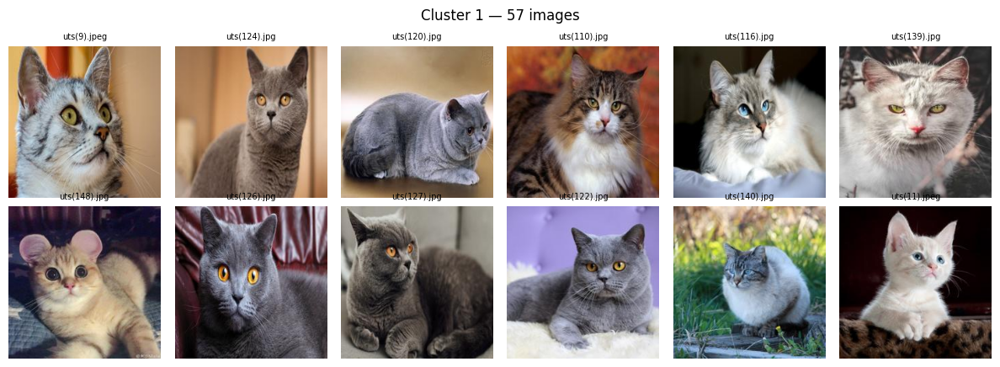

Saved grid: /content/uts_dm2_outputs_modes/rgb/examples/cluster_1_grid.png


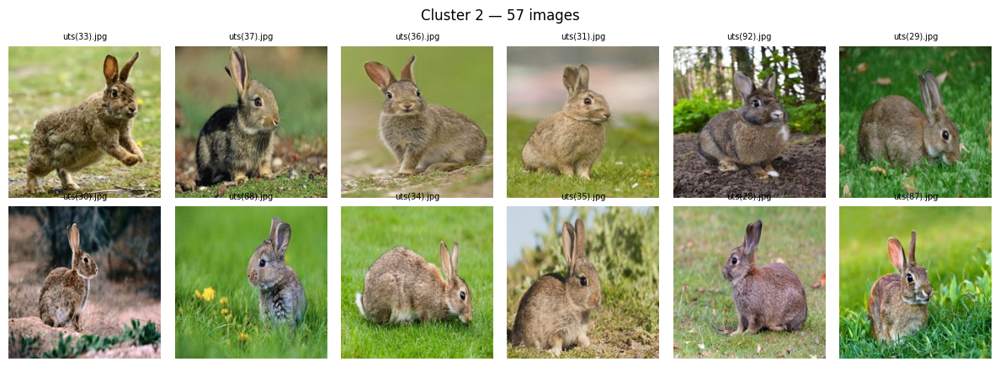

Saved grid: /content/uts_dm2_outputs_modes/rgb/examples/cluster_2_grid.png


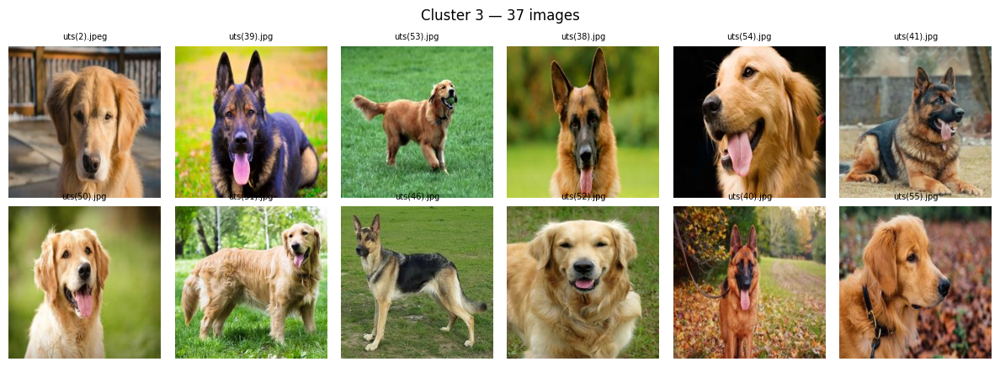

Saved grid: /content/uts_dm2_outputs_modes/rgb/examples/cluster_3_grid.png


,k,silhouette,calinski,davies
2,4,0.189433,21.960615,2.112316
4,6,0.186426,18.388803,1.997681
3,5,0.184693,19.878431,2.008128
7,9,0.175719,15.368154,1.938322
1,3,0.173715,26.014572,2.176770
5,7,0.172006,17.099947,2.059688
8,10,0.168122,14.094547,1.919072
6,8,0.151317,15.616041,2.262141
0,2,0.133620,25.741884,2.327624


In [6]:
MODE = "rgb"
MODE_OUT = (OUT_ROOT / MODE); MODE_OUT.mkdir(exist_ok=True, parents=True)

emb = extract_embeddings(load_and_preprocess_rgb, all_images, batch_size=32)
print("Embeddings", MODE, emb.shape)

X_pca, X_umap, pca = pca_umap(emb, n_pca=50, random_state=42)
print("Explained variance:", round(pca.explained_variance_ratio_.sum(), 4))

bestk, km, labels = try_kmeans(X_pca, range(2,11))
print(f"Best k (KMeans, {MODE}):", bestk)
metrics_report(X_pca, labels, name=f"KMeans(k={bestk}) — {MODE.upper()}")

agg = AgglomerativeClustering(n_clusters=bestk, linkage="ward")
labels_agg = agg.fit_predict(X_pca)
metrics_report(X_pca, labels_agg, name=f"Agglomerative(k={bestk}, ward) — {MODE.upper()}")

db = DBSCAN(eps=1.5, min_samples=5).fit(X_pca)
labels_db = db.labels_
print("DBSCAN clusters:", len(set(labels_db)) - (1 if -1 in labels_db else 0), "| noise:", (labels_db==-1).sum())

scatter_by_labels(X_umap, labels, f"UMAP — KMeans(k={bestk}) — {MODE.upper()}")
scatter_by_labels(X_umap, labels_agg, f"UMAP — Agglomerative(k={bestk}) — {MODE.upper()}")
scatter_by_labels(X_umap, labels_db, f"UMAP — DBSCAN — {MODE.upper()} (noise=-1)")

filenames = [str(p) for p in all_images]
df_csv = pd.DataFrame({"filepath": filenames, "cluster_kmeans": labels, "x": X_umap[:,0], "y": X_umap[:,1]})
csv_path = MODE_OUT / f"clusters_kmeans_{MODE}.csv"
df_csv.to_csv(csv_path, index=False); print("Saved:", csv_path)

examples_dir = MODE_OUT / "examples"
_ = save_examples_grid(filenames, X_pca, labels, km, examples_dir, n_per_cluster=12, cols=6)

def eval_many_k(X, ks):
    rows = []
    for k in ks:
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = km.fit_predict(X)
        sil = silhouette_score(X, labels)
        ch  = calinski_harabasz_score(X, labels)
        db  = davies_bouldin_score(X, labels)
        rows.append(dict(k=k, silhouette=sil, calinski=ch, davies=db))
    return pd.DataFrame(rows).sort_values("silhouette", ascending=False)

eval_table_rgb = eval_many_k(X_pca, list(range(2,11)))
eval_table_rgb

# Eksperimen 2 — **Grayscale**

/tmp/ipython-input-1061819322.py:13: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")


Embeddings grayscale (173, 1280)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Explained variance: 0.7821


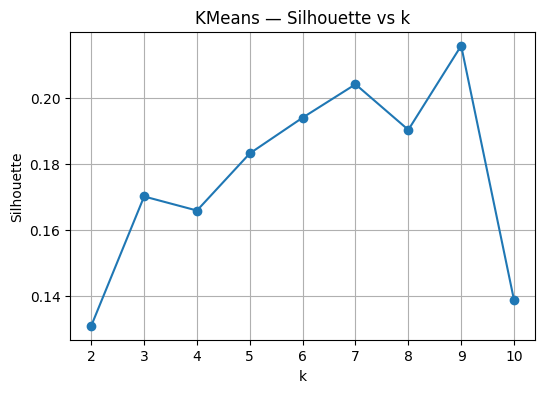

Best k (KMeans, grayscale): 9
KMeans(k=9) — Grayscale: Silhouette=0.216 | Calinski-Harabasz=15.4 | Davies-Bouldin=1.857
Agglomerative(k=9, ward) — Grayscale: Silhouette=0.213 | Calinski-Harabasz=15.6 | Davies-Bouldin=1.768
DBSCAN clusters: 0 | noise: 173


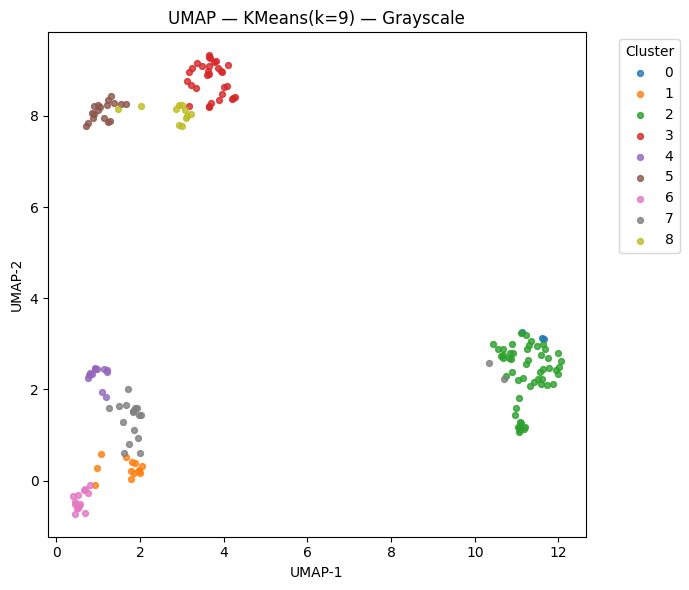

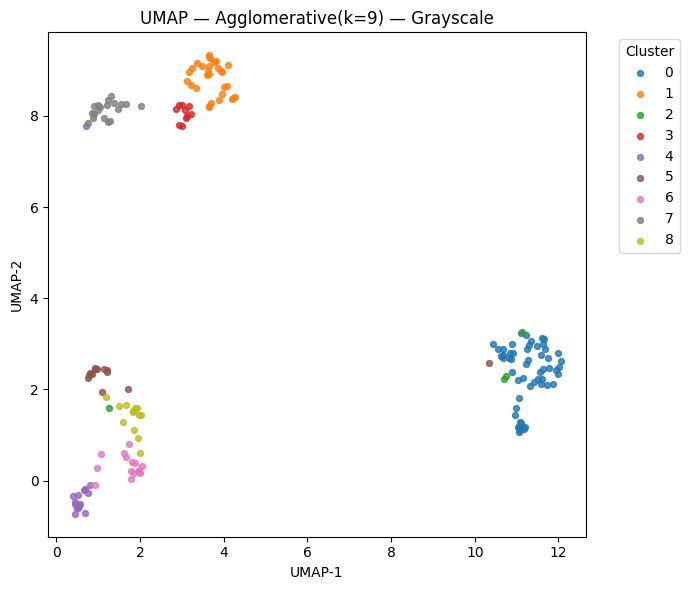

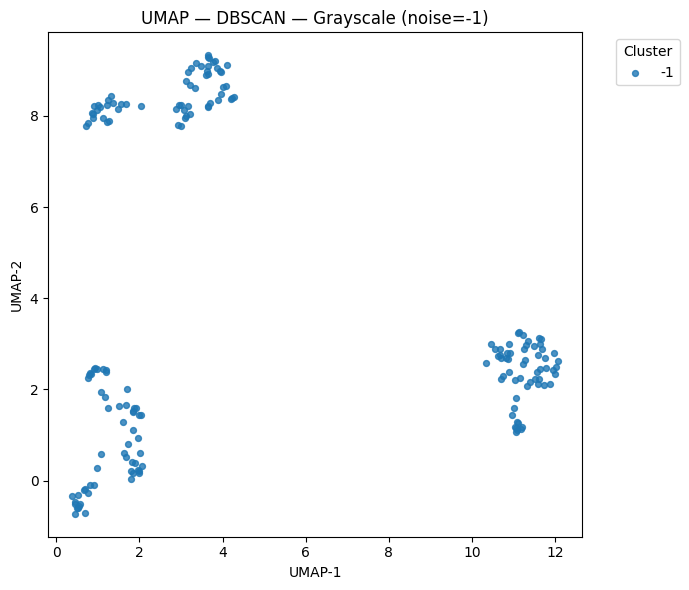

Saved: /content/uts_dm2_outputs_modes/grayscale/clusters_kmeans_grayscale.csv


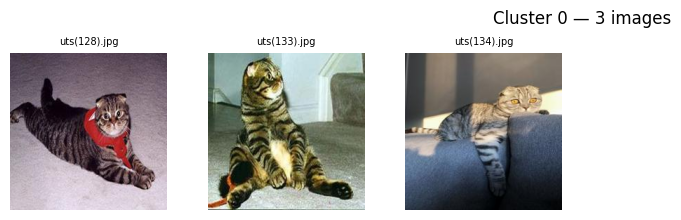

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_0_grid.png


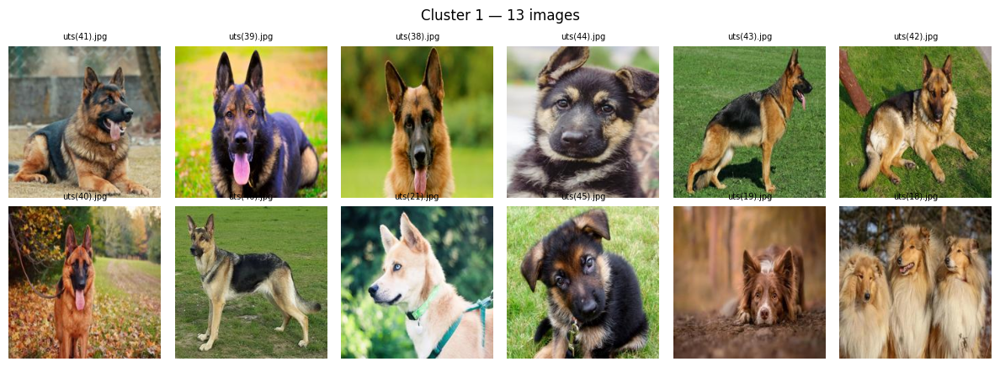

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_1_grid.png


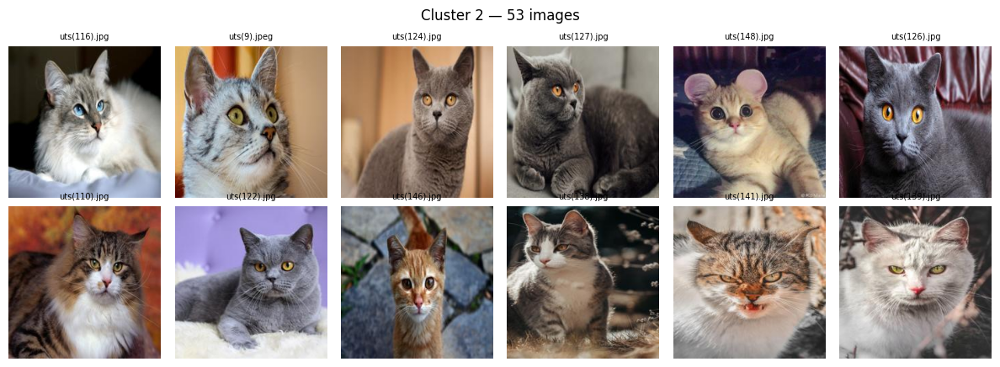

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_2_grid.png


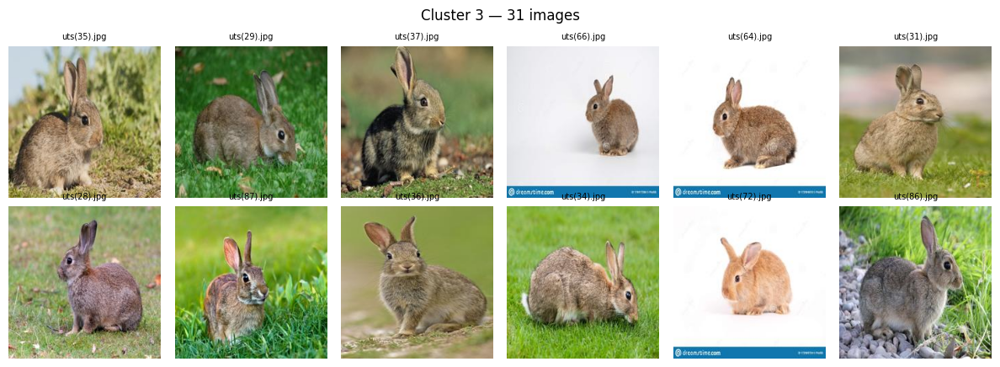

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_3_grid.png


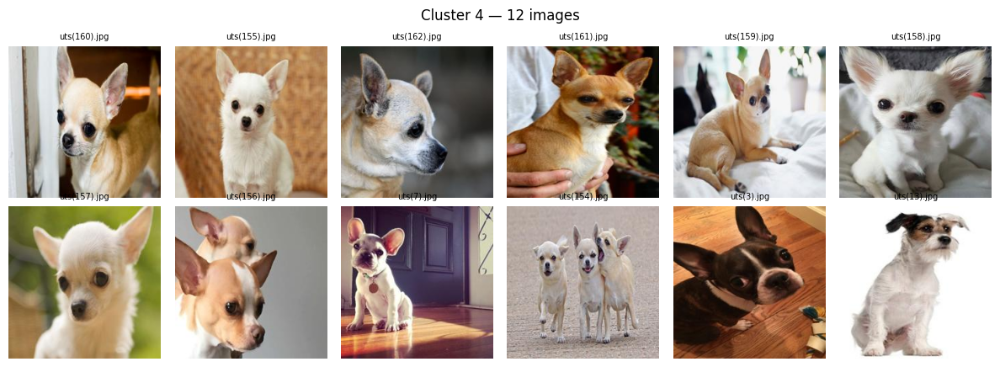

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_4_grid.png


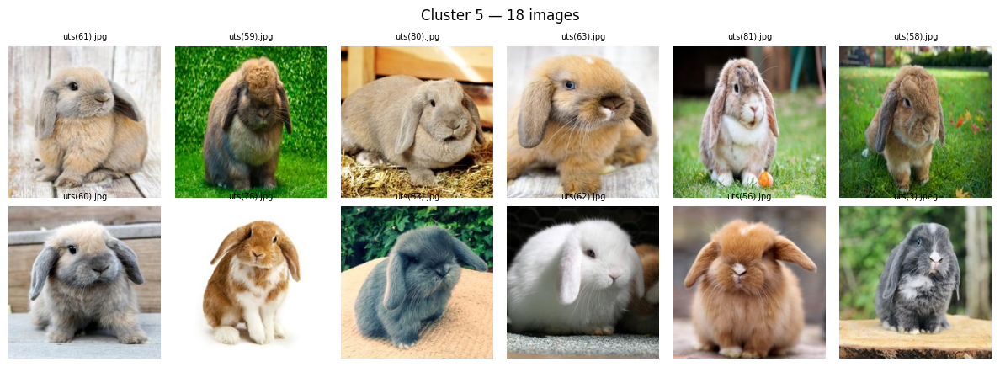

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_5_grid.png


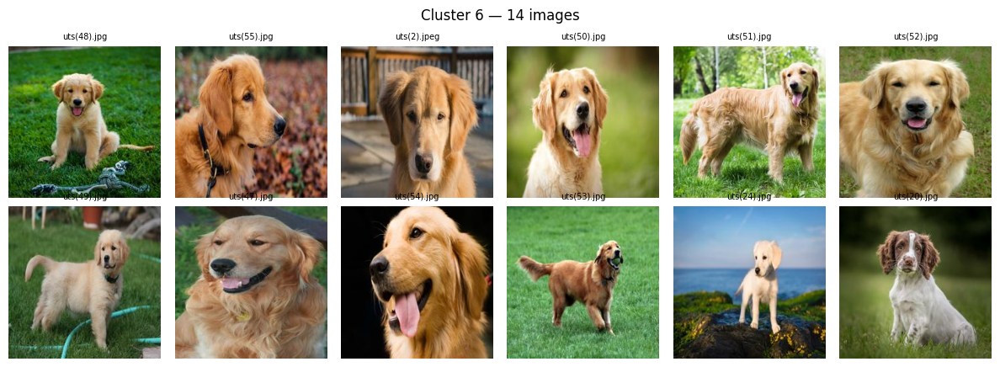

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_6_grid.png


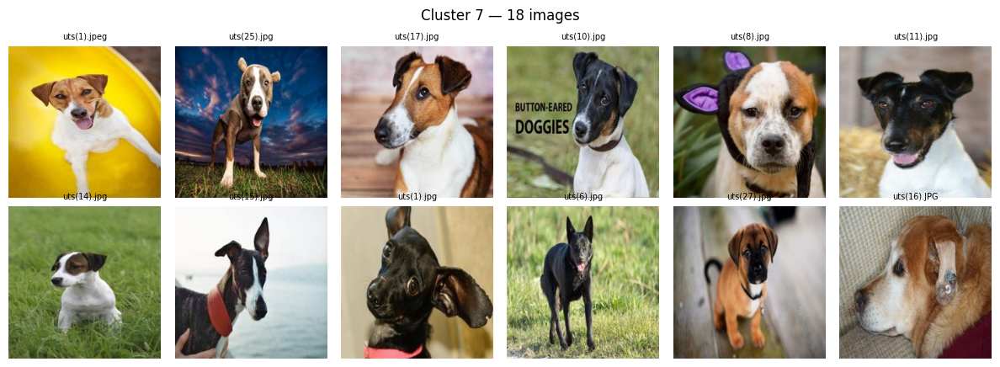

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_7_grid.png


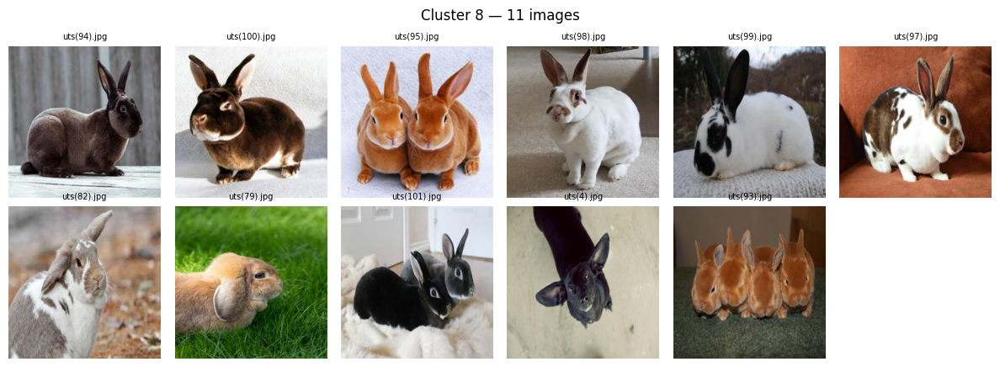

Saved grid: /content/uts_dm2_outputs_modes/grayscale/examples/cluster_8_grid.png


,k,silhouette,calinski,davies
7,9,0.215707,15.406721,1.856774
5,7,0.204027,17.224033,1.779413
4,6,0.193919,18.329813,1.965682
6,8,0.190229,16.353710,1.943698
3,5,0.183090,19.741758,2.010763
1,3,0.170044,24.755789,2.250124
2,4,0.165780,21.419409,2.078547
8,10,0.138665,14.321260,2.021133
0,2,0.130890,24.903851,2.337784


In [7]:
MODE = "grayscale"
MODE_OUT = (OUT_ROOT / MODE); MODE_OUT.mkdir(exist_ok=True, parents=True)

emb = extract_embeddings(load_and_preprocess_grayscale, all_images, batch_size=32)
print("Embeddings", MODE, emb.shape)

X_pca, X_umap, pca = pca_umap(emb, n_pca=50, random_state=42)
print("Explained variance:", round(pca.explained_variance_ratio_.sum(), 4))

bestk, km, labels = try_kmeans(X_pca, range(2,11))
print(f"Best k (KMeans, {MODE}):", bestk)
metrics_report(X_pca, labels, name=f"KMeans(k={bestk}) — {MODE.title()}")

agg = AgglomerativeClustering(n_clusters=bestk, linkage="ward")
labels_agg = agg.fit_predict(X_pca)
metrics_report(X_pca, labels_agg, name=f"Agglomerative(k={bestk}, ward) — {MODE.title()}")

db = DBSCAN(eps=1.5, min_samples=5).fit(X_pca)
labels_db = db.labels_
print("DBSCAN clusters:", len(set(labels_db)) - (1 if -1 in labels_db else 0), "| noise:", (labels_db==-1).sum())

scatter_by_labels(X_umap, labels, f"UMAP — KMeans(k={bestk}) — {MODE.title()}")
scatter_by_labels(X_umap, labels_agg, f"UMAP — Agglomerative(k={bestk}) — {MODE.title()}")
scatter_by_labels(X_umap, labels_db, f"UMAP — DBSCAN — {MODE.title()} (noise=-1)")

filenames = [str(p) for p in all_images]
df_csv = pd.DataFrame({"filepath": filenames, "cluster_kmeans": labels, "x": X_umap[:,0], "y": X_umap[:,1]})
csv_path = MODE_OUT / f"clusters_kmeans_{MODE}.csv"
df_csv.to_csv(csv_path, index=False); print("Saved:", csv_path)

examples_dir = MODE_OUT / "examples"
_ = save_examples_grid(filenames, X_pca, labels, km, examples_dir, n_per_cluster=12, cols=6)

eval_table_gs = eval_many_k(X_pca, list(range(2,11)))
eval_table_gs

**Interpretasi**

1. K-Means silhoutte

Pada mode Grayscale, kurva Silhouette vs k mencapai puncak di k = 9 (Silhouette ≈ 0,215), lebih tinggi dibanding konfigurasi RGB (k = 4, Silhouette 0,190). Peningkatan ini menunjukkan bahwa penghilangan warna membuat model lebih menekankan bentuk/tekstur sehingga pemisahan antarkelompok menjadi lebih tegas dan beberapa gugus besar pada RGB terpecah menjadi sub-kelompok yang lebih homogen. Secara visual (UMAP), gugus hewan dengan karakter morfologi kuat (kelinci, kucing) tetap kompak, sedangkan kelompok anjing terbagi lebih jelas berdasarkan ukuran/proporsi wajah/tekstur bulu alih-alih sekadar perbedaan warna atau pencahayaan latar. Dengan demikian, Grayscale efektif mengurangi pengaruh latar berwarna dan meningkatkan separasi, walau perlu menghindari over-clustering pada cluster yang sangat kecil.

2. Agglomerative

Pada mode Grayscale, metode Agglomerative (Ward) dengan k=9 menghasilkan Silhouette 0,213, Calinski–Harabasz 15,6, dan Davies–Bouldin 1,768. Nilai Silhouette yang tinggi dan DB yang rendah menunjukkan pemisahan cluster yang lebih tegas dan kemiripan antarcluster yang lebih kecil dibanding konfigurasi RGB. Meskipun nilai CH lebih rendah dari RGB—kemungkinan karena jumlah cluster yang lebih banyak (k=9) dan ukuran cluster yang lebih kecil—secara keseluruhan hasil ini mengindikasikan bahwa penghilangan warna menonjolkan morfologi/tekstur sehingga struktur kelompok menjadi lebih jelas. Kualitasnya setara dengan KMeans pada mode yang sama (Silhouette ≈ 0,215), sehingga Grayscale terbukti efektif untuk dataset ini, sementara Ward berfungsi baik sebagai pembanding yang konsisten.

3. DBSCAN

Penerapan DBSCAN pada ruang fitur Grayscale tidak membentuk cluster (seluruh 173 sampel diklasifikasikan sebagai noise). Hal ini menunjukkan tidak ada gumpalan kepadatan yang stabil pada skala jarak (eps) yang dicoba, sehingga pendekatan berbasis kepadatan kurang cocok untuk dataset ini. Dibandingkan KMeans/Agglomerative yang berhasil memisahkan data (Silhouette ≈ 0.215/0.213 pada k=9), DBSCAN gagal karena struktur data cenderung menyebar dan saling tumpang-tindih alih-alih berinti padat.

4. UMAP

Pada mode Grayscale, UMAP memperlihatkan empat blok besar yang terpisah dan pecah menjadi sembilan sub-cluster rapat. Hilangnya warna membuat pemisahan ditentukan oleh morfologi dan tekstur—terlihat dari gugus yang sebelumnya memanjang kini terbelah menjadi sub-gugus lebih homogen, sehingga Silhouette meningkat (≈0,215 untuk KMeans; 0,213 untuk Agglomerative) dan Davies–Bouldin menurun. KMeans dan Agglomerative menghasilkan pola spasial yang hampir sama; Agglomerative sedikit lebih “mengikat” area yang bertingkat di bagian bawah-kiri, sedangkan KMeans memotongnya menjadi beberapa unit kecil. Sementara itu, DBSCAN gagal membentuk cluster karena tidak menemukan kepadatan lokal yang memadai. Secara keseluruhan, Grayscale efektif meningkatkan separasi berbasis bentuk/tekstur dan layak dijadikan konfigurasi alternatif yang kuat dibanding RGB.

5. Gambar cluster

Pada mode Grayscale, sembilan cluster yang terbentuk sangat selaras dengan morfologi objek: perbedaan telinga tegak vs jatuh pada kelinci (C3 vs C5), shepherd vs golden pada anjing besar (C1 vs C6), serta kucing close-up yang kompak (C2). Metrik evaluasi (Silhouette ≈ 0,215; Agglomerative: 0,213, DB 1,768) mengonfirmasi bahwa pemisahan berbasis bentuk/tekstur lebih tegas daripada RGB. Walaupun muncul satu dua cluster kecil (mis. C0 n=3), mayoritas cluster berukuran memadai dan homogen, sehingga Grayscale layak dipakai sebagai konfigurasi unggulan untuk interpretasi deskriptif pada dataset ini.

6. Ringkasan

Untuk mode Grayscale, kami memilih k = 9 sebagai konfigurasi utama karena memberikan Silhouette tertinggi (0,2157) dengan Davies–Bouldin rendah (1,8568). Hasil ini konsisten dengan visualisasi UMAP: gugus besar pada RGB terpecah menjadi sub-gugus homogen berbasis morfologi/tekstur (mis. shepherd vs golden; telinga kelinci tegak vs jatuh).
Jika dibutuhkan lebih sedikit cluster, alternatif k = 7 layak dipertimbangkan karena DB terendah (1,779) dengan Silhouette masih tinggi (0,204), sehingga menawarkan pemisahan baik sambil menjaga jumlah kelompok lebih ringkas.

# Eksperimen 3 — **CLAHE**

/tmp/ipython-input-1061819322.py:13: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(weights="imagenet", include_top=False, pooling="avg")


Embeddings clahe (173, 1280)


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Explained variance: 0.774


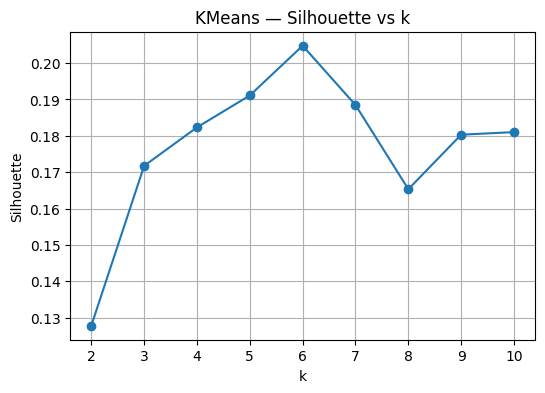

Best k (KMeans, clahe): 6
KMeans(k=6) — CLAHE: Silhouette=0.205 | Calinski-Harabasz=18.7 | Davies-Bouldin=1.963
Agglomerative(k=6, ward) — CLAHE: Silhouette=0.194 | Calinski-Harabasz=17.8 | Davies-Bouldin=1.876
DBSCAN clusters: 0 | noise: 173


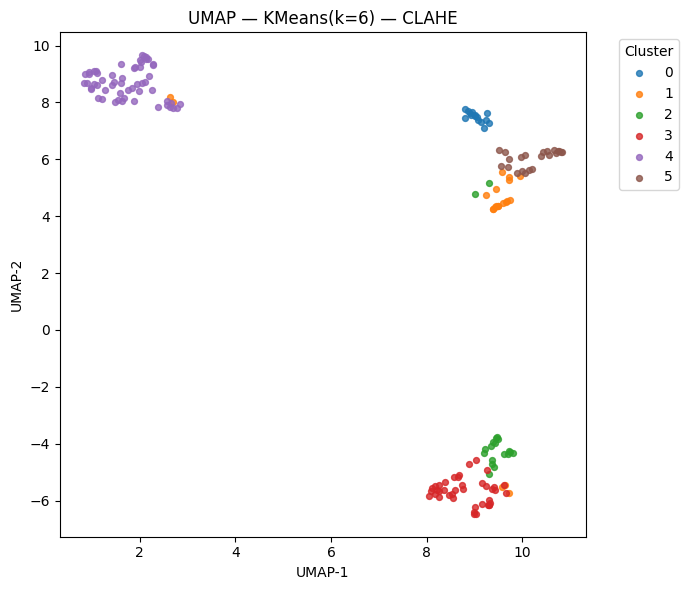

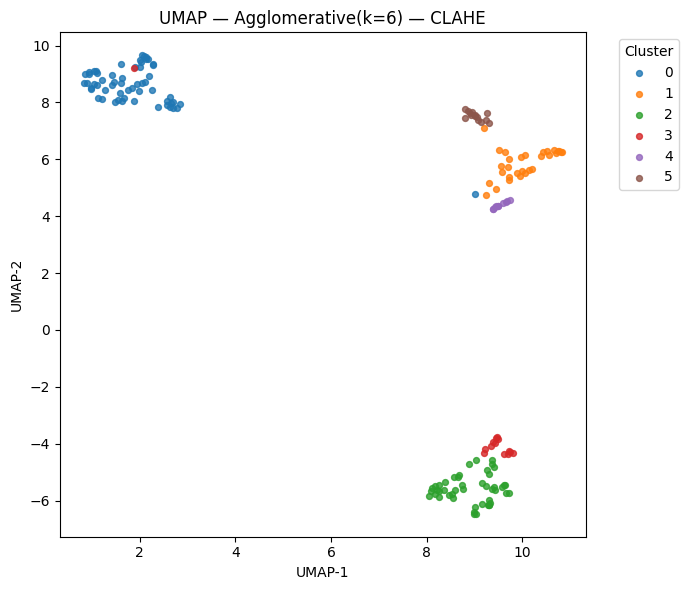

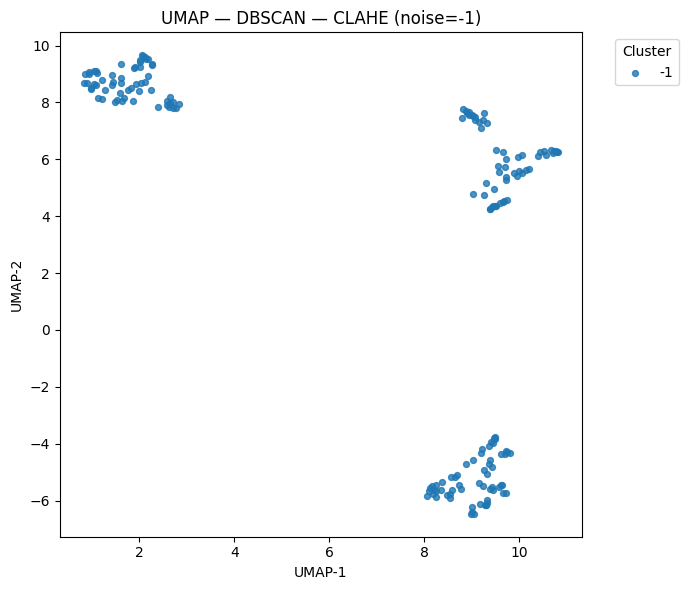

Saved: /content/uts_dm2_outputs_modes/clahe/clusters_kmeans_clahe.csv


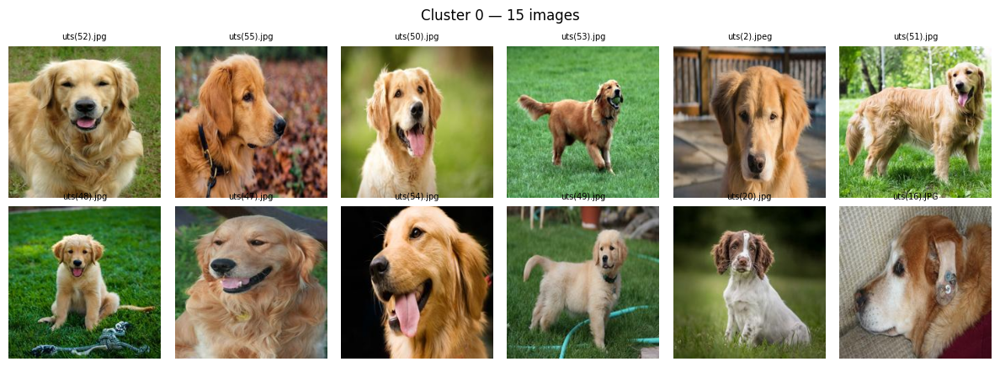

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_0_grid.png


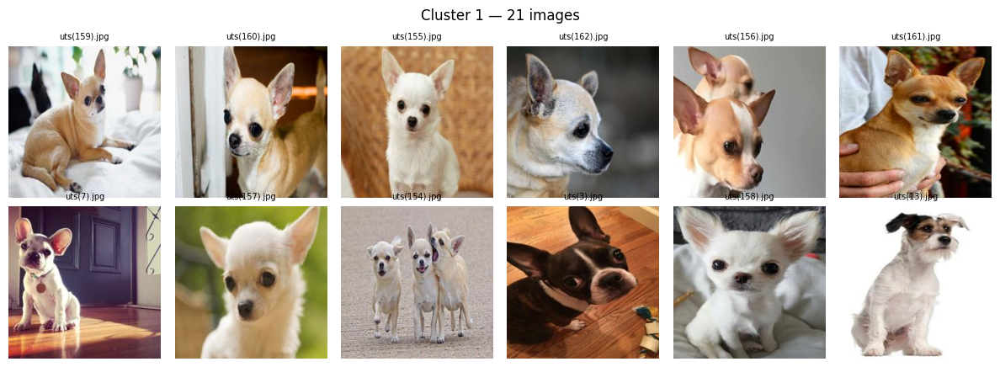

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_1_grid.png


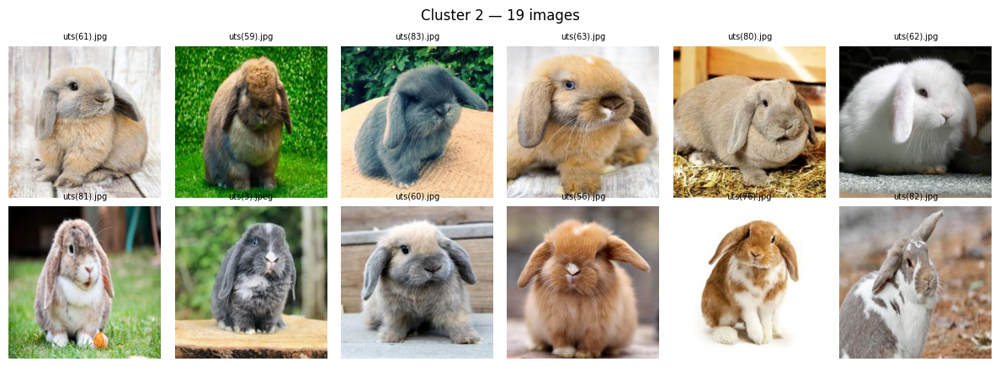

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_2_grid.png


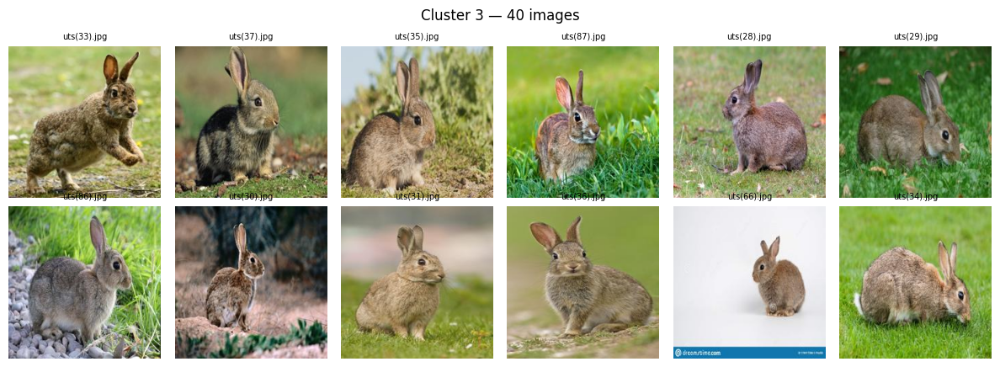

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_3_grid.png


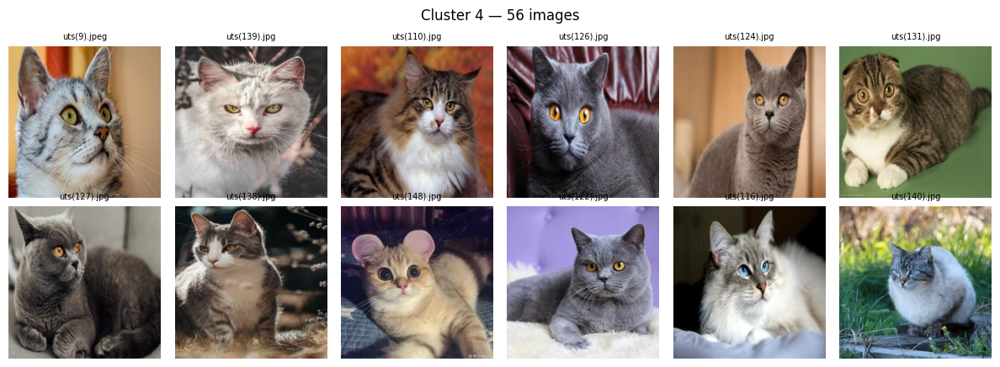

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_4_grid.png


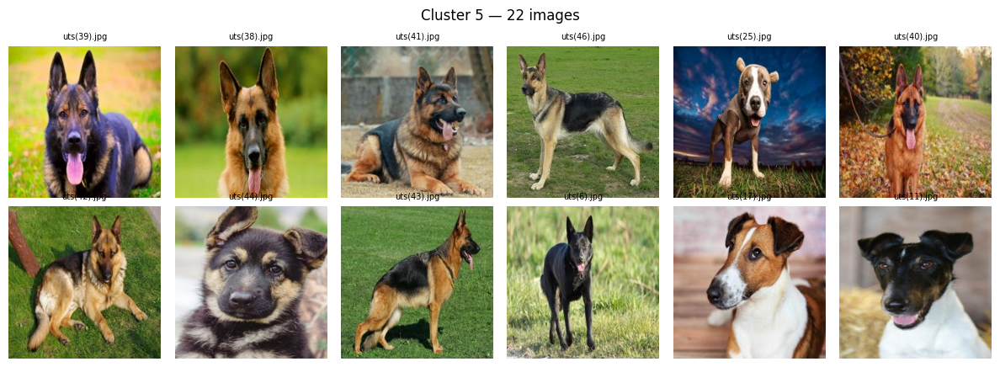

Saved grid: /content/uts_dm2_outputs_modes/clahe/examples/cluster_5_grid.png


,k,silhouette,calinski,davies
4,6,0.204785,18.705118,1.963189
3,5,0.191111,20.223137,1.884263
5,7,0.188480,17.457224,1.961948
2,4,0.182317,21.362371,2.114543
8,10,0.181014,14.134259,2.115625
7,9,0.180313,15.204238,2.074022
1,3,0.171738,25.637117,2.160072
6,8,0.165312,15.807784,2.192963
0,2,0.127754,24.836382,2.373513


In [8]:
MODE = "clahe"
MODE_OUT = (OUT_ROOT / MODE); MODE_OUT.mkdir(exist_ok=True, parents=True)

emb = extract_embeddings(load_and_preprocess_clahe, all_images, batch_size=32)
print("Embeddings", MODE, emb.shape)

X_pca, X_umap, pca = pca_umap(emb, n_pca=50, random_state=42)
print("Explained variance:", round(pca.explained_variance_ratio_.sum(), 4))

bestk, km, labels = try_kmeans(X_pca, range(2,11))
print(f"Best k (KMeans, {MODE}):", bestk)
metrics_report(X_pca, labels, name=f"KMeans(k={bestk}) — CLAHE")

agg = AgglomerativeClustering(n_clusters=bestk, linkage="ward")
labels_agg = agg.fit_predict(X_pca)
metrics_report(X_pca, labels_agg, name=f"Agglomerative(k={bestk}, ward) — CLAHE")

db = DBSCAN(eps=1.5, min_samples=5).fit(X_pca)
labels_db = db.labels_
print("DBSCAN clusters:", len(set(labels_db)) - (1 if -1 in labels_db else 0), "| noise:", (labels_db==-1).sum())

scatter_by_labels(X_umap, labels, f"UMAP — KMeans(k={bestk}) — CLAHE")
scatter_by_labels(X_umap, labels_agg, f"UMAP — Agglomerative(k={bestk}) — CLAHE")
scatter_by_labels(X_umap, labels_db, "UMAP — DBSCAN — CLAHE (noise=-1)")

filenames = [str(p) for p in all_images]
df_csv = pd.DataFrame({"filepath": filenames, "cluster_kmeans": labels, "x": X_umap[:,0], "y": X_umap[:,1]})
csv_path = MODE_OUT / f"clusters_kmeans_{MODE}.csv"
df_csv.to_csv(csv_path, index=False); print("Saved:", csv_path)

examples_dir = MODE_OUT / "examples"
_ = save_examples_grid(filenames, X_pca, labels, km, examples_dir, n_per_cluster=12, cols=6)

eval_table_ch = eval_many_k(X_pca, list(range(2,11)))
eval_table_ch